# Выпускная квалификационная работа по курсу «Data Science»

### Предобработка данных

In [1]:
# Импортирую необходимые библиотеки
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
# Загружаем датасет из файла X_bp.xlsx
x_bp = pd.read_excel('data/X_bp.xlsx', index_col=0)
x_bp.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2"
0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0
2,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0


In [3]:
x_bp.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1023 entries, 0 to 1022
Data columns (total 10 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       1023 non-null   float64
 1   Плотность, кг/м3                      1023 non-null   float64
 2   модуль упругости, ГПа                 1023 non-null   float64
 3   Количество отвердителя, м.%           1023 non-null   float64
 4   Содержание эпоксидных групп,%_2       1023 non-null   float64
 5   Температура вспышки, С_2              1023 non-null   float64
 6   Поверхностная плотность, г/м2         1023 non-null   float64
 7   Модуль упругости при растяжении, ГПа  1023 non-null   float64
 8   Прочность при растяжении, МПа         1023 non-null   float64
 9   Потребление смолы, г/м2               1023 non-null   float64
dtypes: float64(10)
memory usage: 87.9 KB


In [4]:
# Описательная статистика по датасету x_bp
x_bp.describe()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2"
count,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000
mean,2.930366,1975.734888,739.923233,110.570769,22.244390,285.882151,482.731833,73.328571,2466.922843,218.423144
std,0.913222,73.729231,330.231581,28.295911,2.406301,40.943260,281.314690,3.118983,485.628006,59.735931
min,0.389403,1731.764635,2.436909,17.740275,14.254985,100.000000,0.603740,64.054061,1036.856605,33.803026
25%,2.317887,1924.155467,500.047452,92.443497,20.608034,259.066528,266.816645,71.245018,2135.850448,179.627520
50%,2.906878,1977.621657,739.664328,110.564840,22.230744,285.896812,451.864365,73.268805,2459.524526,219.198882
75%,3.552660,2021.374375,961.812526,129.730366,23.961934,313.002106,693.225017,75.356612,2767.193119,257.481724
max,5.591742,2207.773481,1911.536477,198.953207,33.000000,413.273418,1399.542362,82.682051,3848.436732,414.590628


In [5]:
# Загружаем датасет из файла X_nup.xlsx
x_nup = pd.read_excel('data/X_nup.xlsx', index_col=0)
x_nup.head()

,"Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,0,4.0,57.0
1,0,4.0,60.0
2,0,4.0,70.0
3,0,5.0,47.0
4,0,5.0,57.0


In [6]:
x_nup.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1040 entries, 0 to 1039
Data columns (total 3 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Угол нашивки, град  1040 non-null   int64  
 1   Шаг нашивки         1040 non-null   float64
 2   Плотность нашивки   1040 non-null   float64
dtypes: float64(2), int64(1)
memory usage: 32.5 KB


In [7]:
# Описательная статистика по датасету x_nup
x_nup.describe()

,"Угол нашивки, град",Шаг нашивки,Плотность нашивки
count,1040.00000,1040.000000,1040.000000
mean,45.00000,6.911385,57.248399
std,45.02165,2.555181,12.332438
min,0.00000,0.000000,0.000000
25%,0.00000,5.102256,49.970740
50%,45.00000,6.938000,57.413594
75%,90.00000,8.587662,65.107235
max,90.00000,14.440522,103.988901


In [8]:
# Объединем датасеты х_bp и х_nup по индексу, тип объединения INNER
df1 = x_bp.merge(x_nup, how = 'inner', left_index = True, right_index = True)
df1.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0,0,4.0,57.0
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,60.0
2,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,70.0
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0,5.0,47.0
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,57.0


In [9]:
# Определим количество уникальных значений по столбцам
df1.nunique()

Соотношение матрица-наполнитель         1014
Плотность, кг/м3                        1013
модуль упругости, ГПа                   1020
Количество отвердителя, м.%             1005
Содержание эпоксидных групп,%_2         1004
Температура вспышки, С_2                1003
Поверхностная плотность, г/м2           1004
Модуль упругости при растяжении, ГПа    1004
Прочность при растяжении, МПа           1004
Потребление смолы, г/м2                 1003
Угол нашивки, град                         2
Шаг нашивки                              989
Плотность нашивки                        988
dtype: int64

Количество уникальных значений в колонке Угол нашивки равно 2, можем привести данные в этой колонке к значениям 0 и 1.

In [10]:
#Проверим кол-во элементов, где Угол нашивки равен 0 градусов
df1['Угол нашивки, град'][df1['Угол нашивки, град'] == 0.0].count()

520

In [11]:
df = df1.copy()

In [12]:
# Приведем значения колонки Угол нашивки к значениям 0 и 1.
df = df.replace({'Угол нашивки, град': {0.0 : 0, 90.0 : 1}})
df['Угол нашивки, град'] = df['Угол нашивки, град'].astype(int)

In [13]:
df = df.rename(columns={'Угол нашивки, град' : 'Угол нашивки'})

In [14]:
df['Угол нашивки'][df['Угол нашивки'] == 0].count()

520

После преобразования колонки Угол нашивки, количество элементов не изменилось

In [15]:
df.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Угол нашивки,Шаг нашивки,Плотность нашивки
0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0,0,4.0,57.0
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,60.0
2,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,70.0
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0,5.0,47.0
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,57.0


In [16]:
# Проверим на дубликаты
df.duplicated().sum()

0

In [17]:
# Проверим на пустые значения
df.isnull().sum()

Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
модуль упругости, ГПа                   0
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    0
Прочность при растяжении, МПа           0
Потребление смолы, г/м2                 0
Угол нашивки                            0
Шаг нашивки                             0
Плотность нашивки                       0
dtype: int64

Пропущенные данные в датасете отсутствуют

In [18]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1023 entries, 0 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       1023 non-null   float64
 1   Плотность, кг/м3                      1023 non-null   float64
 2   модуль упругости, ГПа                 1023 non-null   float64
 3   Количество отвердителя, м.%           1023 non-null   float64
 4   Содержание эпоксидных групп,%_2       1023 non-null   float64
 5   Температура вспышки, С_2              1023 non-null   float64
 6   Поверхностная плотность, г/м2         1023 non-null   float64
 7   Модуль упругости при растяжении, ГПа  1023 non-null   float64
 8   Прочность при растяжении, МПа         1023 non-null   float64
 9   Потребление смолы, г/м2               1023 non-null   float64
 10  Угол нашивки                          1023 non-null   int32  
 11  Шаг нашивки      

In [19]:
df.index = df.index.astype('int')

In [20]:
df.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Угол нашивки,Шаг нашивки,Плотность нашивки
0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0,0,4.0,57.0
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,60.0
2,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,70.0
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0,5.0,47.0
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,57.0


In [21]:
# Описательная статистика по объединенному датасету
df.describe()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Угол нашивки,Шаг нашивки,Плотность нашивки
count,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000
mean,2.930366,1975.734888,739.923233,110.570769,22.244390,285.882151,482.731833,73.328571,2466.922843,218.423144,0.491691,6.899222,57.153929
std,0.913222,73.729231,330.231581,28.295911,2.406301,40.943260,281.314690,3.118983,485.628006,59.735931,0.500175,2.563467,12.350969
min,0.389403,1731.764635,2.436909,17.740275,14.254985,100.000000,0.603740,64.054061,1036.856605,33.803026,0.000000,0.000000,0.000000
25%,2.317887,1924.155467,500.047452,92.443497,20.608034,259.066528,266.816645,71.245018,2135.850448,179.627520,0.000000,5.080033,49.799212
50%,2.906878,1977.621657,739.664328,110.564840,22.230744,285.896812,451.864365,73.268805,2459.524526,219.198882,0.000000,6.916144,57.341920
75%,3.552660,2021.374375,961.812526,129.730366,23.961934,313.002106,693.225017,75.356612,2767.193119,257.481724,1.000000,8.586293,64.944961
max,5.591742,2207.773481,1911.536477,198.953207,33.000000,413.273418,1399.542362,82.682051,3848.436732,414.590628,1.000000,14.440522,103.988901


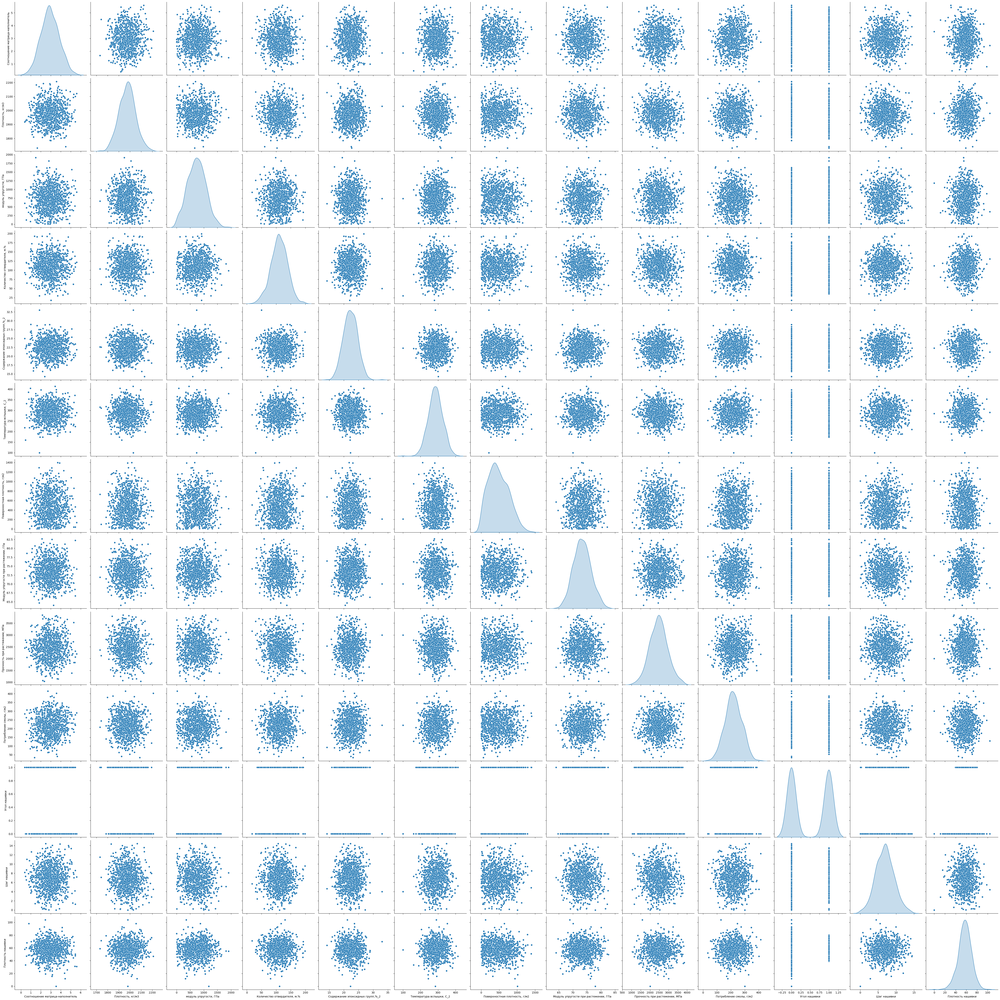

In [22]:
# Построим попарные графики рассеяния
sns.pairplot(df, height=4, diag_kind='kde');

Попарные графики рассеяния точек не показывают какой-либо зависимости между данными

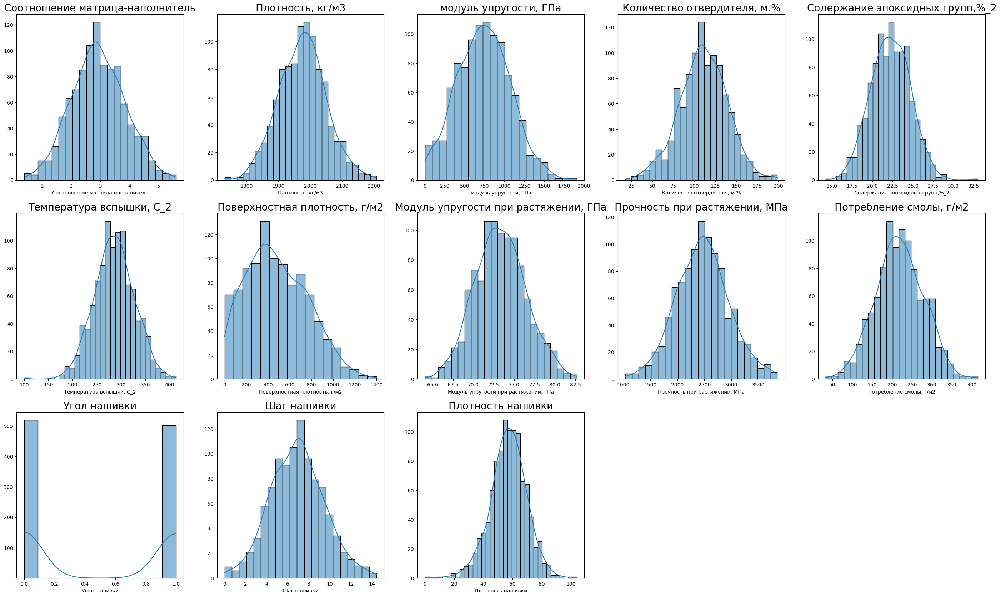

In [23]:
# Построим графики распределения переменных

a = 5
b = 5
c = 1

plt.figure(figsize=(35,35))

for col in df.columns:
    plt.subplot(a, b, c)
    #plt.figure(figsize=(7,5))
    sns.histplot(data = df[col], kde=True)
    plt.ylabel(None)
    plt.title(col, size = 20)
    #plt.show()
    c+=1


In [24]:
# Определим колонки с нормальным распределением, и без нормального распределения
import scipy
accepted_list = []
rejected_list = []

for col in df.columns:
    alpha = 0.05
    stat, p = scipy.stats.normaltest(df[col]) # Критерий согласия Пирсона
    #print('Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print(f'Наименование колонок с данными С нормальным распределением: {accepted_list}')
print(f'Наименование колонок с данными БЕЗ нормального распределения : {rejected_list}')

Наименование колонок с данными С нормальным распределением: ['Соотношение матрица-наполнитель', 'Плотность, кг/м3', 'модуль упругости, ГПа', 'Количество отвердителя, м.%', 'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2', 'Модуль упругости при растяжении, ГПа', 'Прочность при растяжении, МПа', 'Потребление смолы, г/м2', 'Шаг нашивки']
Наименование колонок с данными БЕЗ нормального распределения : ['Поверхностная плотность, г/м2', 'Угол нашивки', 'Плотность нашивки']


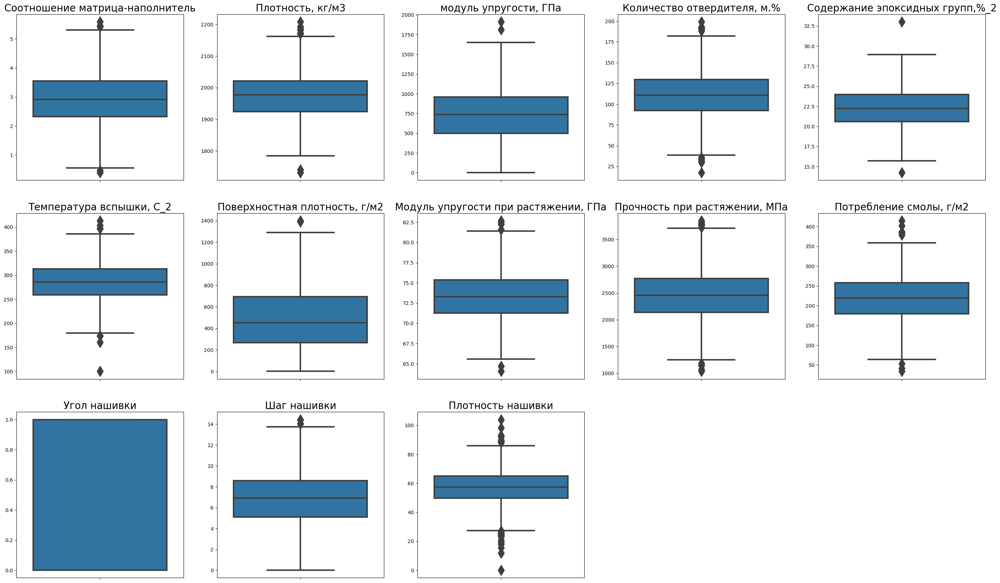

In [25]:
# Построим диаграммы "ящики с усами"
a = 5
b = 5
c = 1

plt.figure(figsize=(35,35))

for col in df.columns:
    plt.subplot(a, b, c)
    sns.boxplot(data = df, y=df[col], fliersize=15, linewidth=3)
    plt.ylabel(None)
    plt.title(col, size = 20)
    c+=1

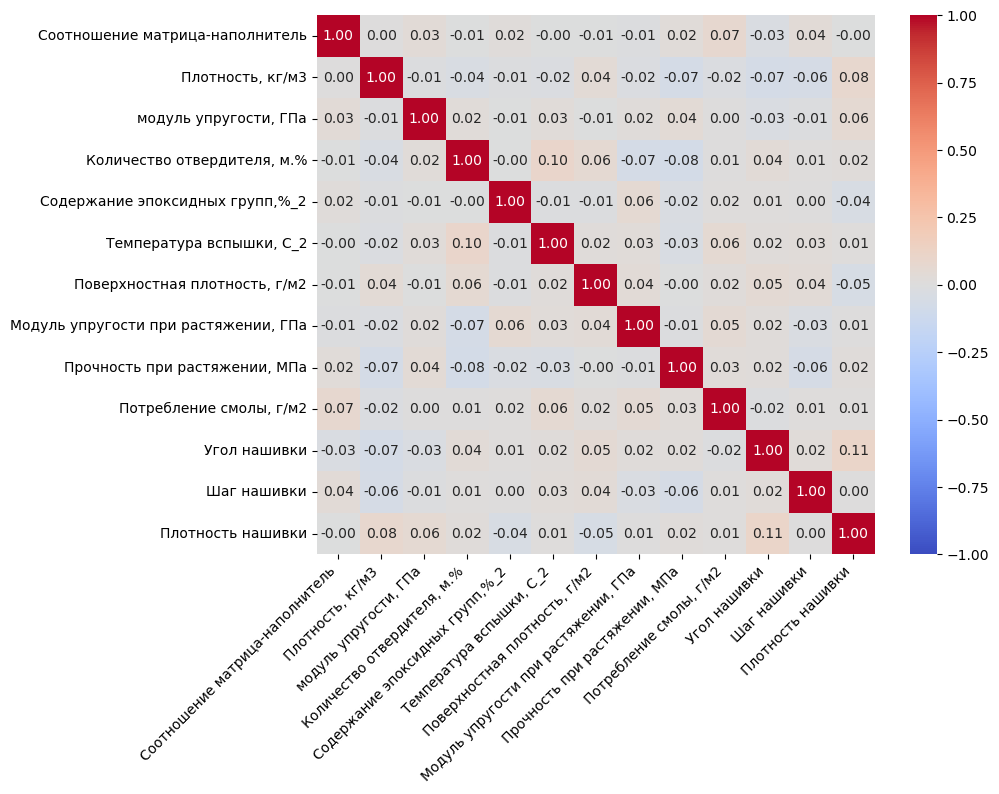

In [26]:
# Рассмотрим матрицу корреляции
matrix = df.corr()
fig, ax = plt.subplots(figsize=(9, 7))
sns.heatmap(matrix, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='coolwarm', ax=ax)
plt.xticks(rotation=45, ha='right')
plt.show()

Максимальная корреляция наблюдается между плотностью нашивки и углом нашивки и составляет всего 0.11, что говорит об отсутствии зависимости между этими данными. Корреляция между всеми параметрами очень близка к 0. Можно сделать вывод, что корреляционные связи между переменными отсутствуют.

Очистим данные от выбросов

In [27]:
for col in df.columns:
    q75,q25 = np.percentile(df.loc[:,col],[75,25])
    intr_qr = q75-q25

    max = q75+(1.5*intr_qr)
    min = q25-(1.5*intr_qr)

    df.loc[df[col] < min,col] = np.nan
    df.loc[df[col] > max,col] = np.nan

In [28]:
df.isnull().sum()

Соотношение матрица-наполнитель          6
Плотность, кг/м3                         9
модуль упругости, ГПа                    2
Количество отвердителя, м.%             14
Содержание эпоксидных групп,%_2          2
Температура вспышки, С_2                 8
Поверхностная плотность, г/м2            2
Модуль упругости при растяжении, ГПа     6
Прочность при растяжении, МПа           11
Потребление смолы, г/м2                  8
Угол нашивки                             0
Шаг нашивки                              4
Плотность нашивки                       21
dtype: int64

Выбросов мало, можно их удалить

In [29]:
df = df.dropna(axis=0)

In [30]:
df.isnull().sum()

Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
модуль упругости, ГПа                   0
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    0
Прочность при растяжении, МПа           0
Потребление смолы, г/м2                 0
Угол нашивки                            0
Шаг нашивки                             0
Плотность нашивки                       0
dtype: int64

In [31]:
# Общая информация после удаление выбросов
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 936 entries, 1 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       936 non-null    float64
 1   Плотность, кг/м3                      936 non-null    float64
 2   модуль упругости, ГПа                 936 non-null    float64
 3   Количество отвердителя, м.%           936 non-null    float64
 4   Содержание эпоксидных групп,%_2       936 non-null    float64
 5   Температура вспышки, С_2              936 non-null    float64
 6   Поверхностная плотность, г/м2         936 non-null    float64
 7   Модуль упругости при растяжении, ГПа  936 non-null    float64
 8   Прочность при растяжении, МПа         936 non-null    float64
 9   Потребление смолы, г/м2               936 non-null    float64
 10  Угол нашивки                          936 non-null    float64
 11  Шаг нашивки       

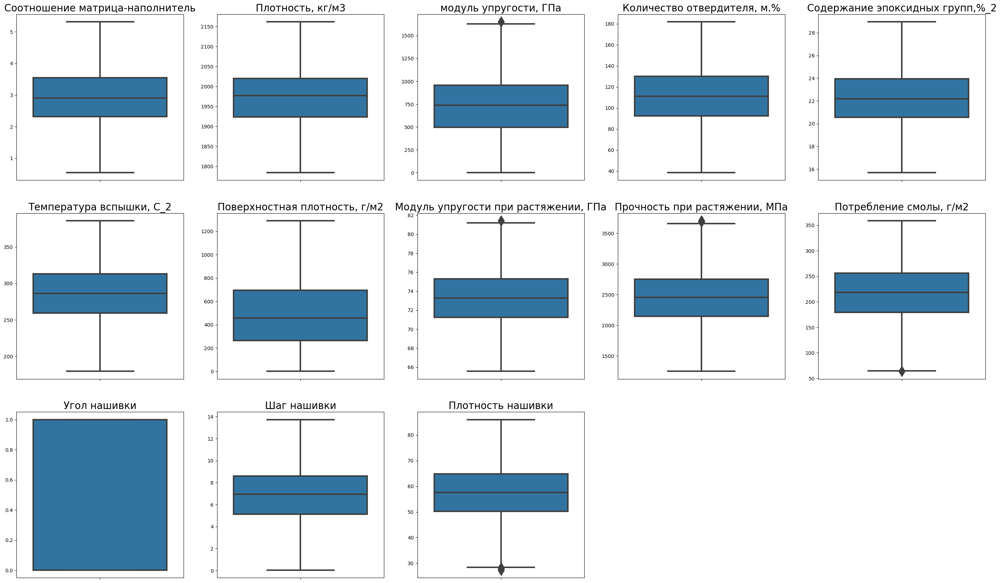

In [32]:
# "Ящики с усами" после удаления выбросов

a = 5
b = 5
c = 1

plt.figure(figsize=(35,35))

for col in df.columns:
    plt.subplot(a, b, c)
    #plt.figure(figsize=(7,5))
    sns.boxplot(data = df, y=df[col], fliersize=15, linewidth=3)
    plt.ylabel(None)
    plt.title(col, size = 20)
    #plt.show()
    c+=1

<Axes: ylabel='Density'>

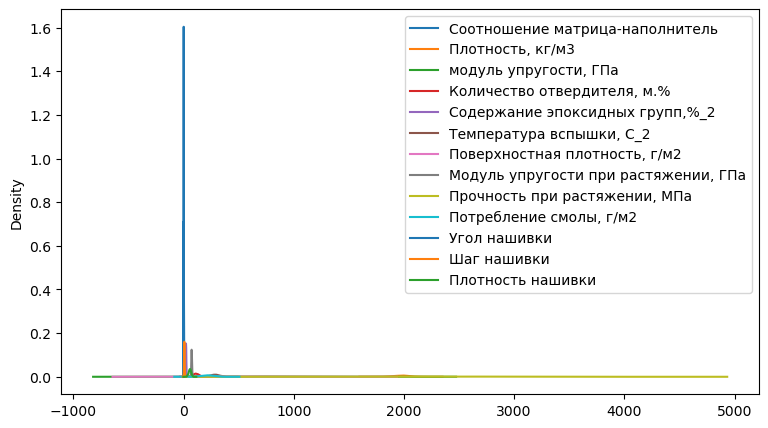

In [33]:
# Проведем оценку плотности ядра
fig, ax = plt.subplots(figsize=(9, 5))
df.plot(kind='kde', ax=ax)

Признаки находятся в разных диапазонах и распределении, необходимо провести нормализацию.

In [34]:
from sklearn.preprocessing import MinMaxScaler

In [35]:
# Нормальзация значений с помощью метода MinMaxScaler
min_max_scaler = MinMaxScaler()
df_norm = pd.DataFrame(min_max_scaler.fit_transform(df), columns = df.columns, index=df.index)

In [36]:
df_norm.describe()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Угол нашивки,Шаг нашивки,Плотность нашивки
count,936.000000,936.000000,936.000000,936.000000,936.000000,936.000000,936.000000,936.000000,936.000000,936.000000,936.000000,936.000000,936.000000
mean,0.498933,0.502695,0.446764,0.504664,0.491216,0.516059,0.373733,0.488647,0.495706,0.521141,0.511752,0.502232,0.513776
std,0.187489,0.187779,0.199583,0.188865,0.180620,0.190624,0.217078,0.191466,0.188915,0.195781,0.500129,0.183258,0.191342
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.372274,0.368517,0.301243,0.376190,0.367716,0.386128,0.205619,0.359024,0.365149,0.392067,0.000000,0.372211,0.390482
50%,0.494538,0.511229,0.447061,0.506040,0.489382,0.515980,0.354161,0.485754,0.491825,0.523766,1.000000,0.504258,0.516029
75%,0.629204,0.624999,0.580446,0.637978,0.623410,0.646450,0.538683,0.615077,0.612874,0.652447,1.000000,0.624604,0.638842
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


<Axes: ylabel='Density'>

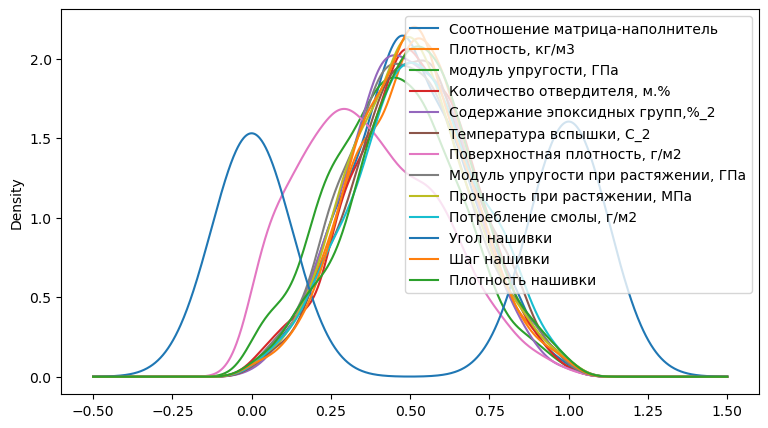

In [37]:
# Оценка плотности ядра после нормализации
fig, ax = plt.subplots(figsize=(9, 5))
df_norm.plot(kind='kde', ax=ax)

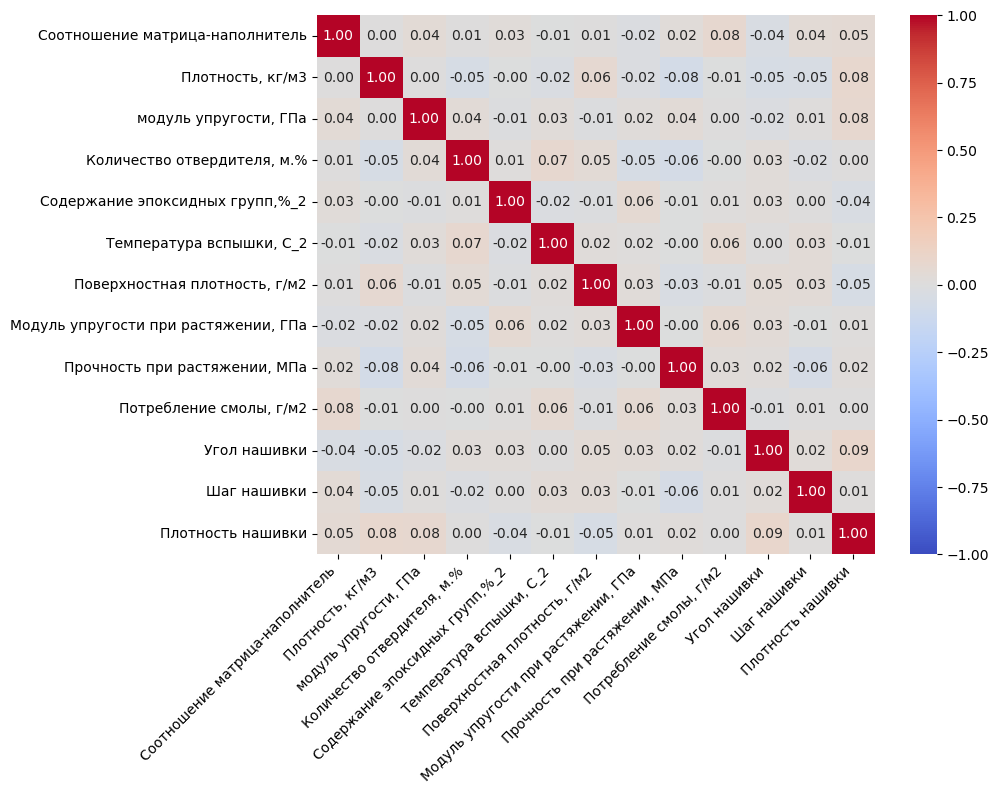

In [38]:
# Рассмотрим матрицу корреляции
matrix = df_norm.corr()
fig, ax = plt.subplots(figsize=(9, 7))
sns.heatmap(matrix, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='coolwarm', ax=ax)
plt.xticks(rotation=45, ha='right')
plt.show()

### Построение моделей для прогноза Модуля упругости при растяжении и Прочности при растяжении

In [78]:
# Импортируем необходимые библиотеки
from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import LinearRegression, SGDRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

In [40]:
# Разбиваем данные на обучающую и тестовую выборки
x_upr = df_norm.drop(['Модуль упругости при растяжении, ГПа'], axis=1)
x_pr = df_norm.drop(['Прочность при растяжении, МПа'], axis=1)
y_upr = df_norm[['Модуль упругости при растяжении, ГПа']]
y_pr = df_norm[['Прочность при растяжении, МПа']]

X_train_upr, X_test_upr, y_train_upr, y_test_upr = train_test_split(x_upr, y_upr, test_size=0.3, random_state=1)
X_train_pr, X_test_pr, y_train_pr, y_test_pr = train_test_split(x_pr, y_pr, test_size=0.3, random_state=1)

In [41]:
errors_df = pd.DataFrame(columns=['target_var','model_name','MSE','R2'])

In [42]:
# Функция для визуализации
def actual_and_predicted_plot(orig, predict, var, model_name):    
    plt.figure(figsize=(17,5))
    plt.title(f'Тестовые и прогнозные значения: {model_name}')
    plt.plot(orig, label='Тест')
    plt.plot(predict, label='Прогноз')
    plt.legend(loc='best')
    plt.ylabel(var)
    plt.xlabel('Количество наблюдений')
    plt.show()

#### Линейная регрессия

In [43]:
# модуль упругости при растяжении

ln_model = LinearRegression()
ln_model.fit(X_train_upr, y_train_upr)
y1_pred_ln = ln_model.predict(X_test_upr)

MSE_upr = mean_squared_error(y_test_upr, y1_pred_ln)
R2_upr = r2_score(y_test_upr, y1_pred_ln)

# прочность при растяжении
ln_model_pro = LinearRegression()
ln_model_pro.fit(X_train_pr, y_train_pr)
y2_pred_ln = ln_model_pro.predict(X_test_pr)

MSE_pr = mean_squared_error(y_test_pr, y2_pred_ln)
R2_pr = r2_score(y_test_pr, y2_pred_ln)


linear_errors = pd.DataFrame({'model_name':'Linear Regression',\
                              'target_var':['Модуль упругости при растяжении', 'Прочность при растяжении'],\
                             'MSE':[MSE_upr, MSE_pr],\
                              'R2':[R2_upr, R2_pr]})
errors_df = pd.concat([errors_df, linear_errors], ignore_index=True)
errors_df

,target_var,model_name,MSE,R2
0,Модуль упругости при растяжении,Linear Regression,0.037967,-0.021335
1,Прочность при растяжении,Linear Regression,0.035043,-0.020508


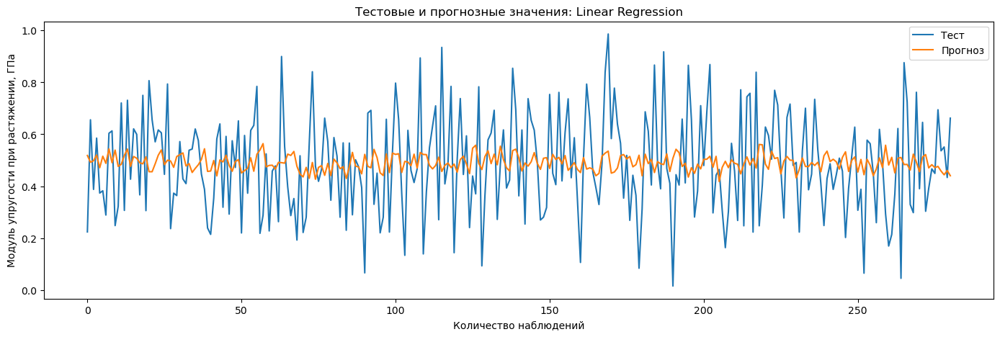

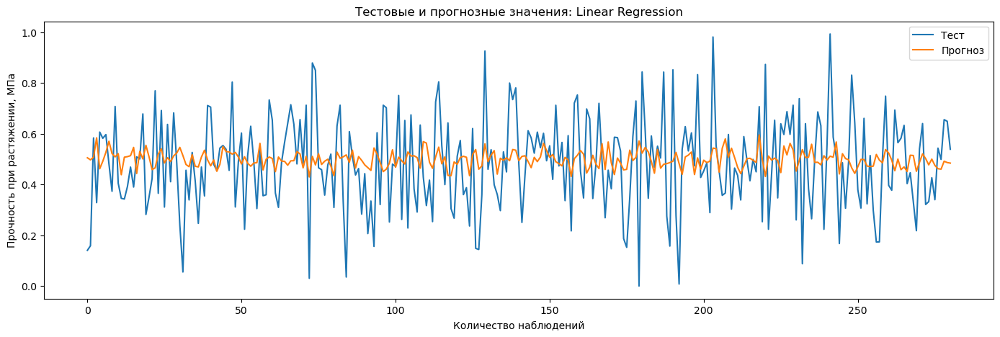

In [44]:
# Визуализация
actual_and_predicted_plot(y_test_upr.values, y1_pred_ln, 'Модуль упругости при растяжении, ГПа', 'Linear Regression')
actual_and_predicted_plot(y_test_pr.values, y2_pred_ln, 'Прочность при растяжении, МПа', 'Linear Regression')

#### Метод К-ближайших соседей

In [58]:
knr_model = KNeighborsRegressor()
neigh_params = {'n_neighbors' : range(1, 101, 1), 
          'weights' : ['uniform', 'distance'],
          'algorithm' : ['auto', 'ball_tree', 'kd_tree', 'brute']
          }

GSCV_neigh_1 = GridSearchCV(knr_model, neigh_params, n_jobs=-1, cv=10)
GSCV_neigh_1.fit(X_train_upr,  y_train_upr)
# GSCV_neigh_1.best_params_
neigh_1 = GSCV_neigh_1.best_estimator_

MSE_upr = mean_squared_error(y_test_upr, neigh_1.predict(X_test_upr))
R2_upr = r2_score(y_test_upr, neigh_1.predict(X_test_upr))

GSCV_neigh_2 = GridSearchCV(knr_model, neigh_params, n_jobs=-1, cv=10)
GSCV_neigh_2.fit(X_train_pr, y_train_pr)
# GSCV_neigh_2.best_params_
neigh_2 = GSCV_neigh_2.best_estimator_

MSE_pro = mean_squared_error(y_test_pr, neigh_2.predict(X_test_pr))
R2_pro = r2_score(y_test_pr, neigh_2.predict(X_test_pr))


neigh_errors = pd.DataFrame({'model_name':'KNeighborsRegressor',\
                                'target_var':['Модуль упругости при растяжении, ГПа', 'Прочность при растяжении, МПа'],\
                               'MSE':[MSE_upr, MSE_pro],\
                               'R2':[R2_upr, R2_pro]})
errors_df = pd.concat([errors_df, neigh_errors], ignore_index=True)
errors_df

C:\Users\anast\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:952: UserWarning: One or more of the test scores are non-finite: [-1.0460611  -1.0460611  -0.50618501 -0.51536856 -0.33680833 -0.34614857
 -0.28727402 -0.29225586 -0.22700382 -0.23249462 -0.20373321 -0.20755852
 -0.15241556 -0.1586949  -0.12855744 -0.13476219 -0.1128448  -0.11866118
 -0.10604847 -0.11099492 -0.09367793 -0.09857926 -0.07874231 -0.08406339
 -0.07862897 -0.08303762 -0.07264274 -0.07652265 -0.05654302 -0.06127144
 -0.05994879 -0.06376495 -0.05444133 -0.05809525 -0.05063213 -0.05406453
 -0.04497155 -0.0486872  -0.04871279 -0.05151713 -0.05139085 -0.05352763
 -0.04961805 -0.05169336 -0.04990086 -0.05146126 -0.04780007 -0.04954245
 -0.04861394 -0.04996244 -0.04311991 -0.04468963 -0.04060776 -0.04223415
 -0.0377784  -0.03963247 -0.03603512 -0.0378545  -0.03536439 -0.03708562
 -0.03005378 -0.03227846 -0.02964052 -0.03177604 -0.02933117 -0.03120399
 -0.02654697 -0.02846597 -0.02222279 -0.02445357 -0.02

C:\Users\anast\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:952: UserWarning: One or more of the test scores are non-finite: [-1.05288791 -1.05288791 -0.45135677 -0.45436538 -0.30081317 -0.30048294
 -0.20587446 -0.20502457 -0.1658963  -0.1634309  -0.14704562 -0.14483479
 -0.13732685 -0.13382994 -0.11590649 -0.1121479  -0.11496055 -0.11061271
 -0.09078058 -0.08781025 -0.08918321 -0.08592843 -0.08759181 -0.08357736
 -0.08677687 -0.08215656 -0.07838018 -0.07483128 -0.07276592 -0.0697989
 -0.06240224 -0.06009342 -0.05166894 -0.05014657 -0.05952096 -0.05678116
 -0.06272301 -0.05947863 -0.06075805 -0.05737479 -0.05948383 -0.05594738
 -0.0584461  -0.05475958 -0.05432865 -0.05134285 -0.05316066 -0.05030867
 -0.04913718 -0.04643986 -0.0478918  -0.04520282 -0.04082297 -0.0388349
 -0.03665309 -0.03505403 -0.03191757 -0.03072187 -0.02938947 -0.02832367
 -0.02441802 -0.02383896 -0.02561733 -0.02486414 -0.02634827 -0.02548204
 -0.02493646 -0.02406459 -0.02463274 -0.02379926 -0.0274

,target_var,model_name,MSE,R2
0,Модуль упругости при растяжении,Linear Regression,0.037967,-0.021335
1,Прочность при растяжении,Linear Regression,0.035043,-0.020508
2,"Модуль упругости при растяжении, ГПа",KNeighborsRegressor,0.037567,-0.010577
3,"Прочность при растяжении, МПа",KNeighborsRegressor,0.035460,-0.032639
4,"Модуль упругости при растяжении, ГПа",RandomForestRegressor,0.038259,-0.029186
5,"Прочность при растяжении, МПа",RandomForestRegressor,0.035015,-0.019699
6,"Модуль упругости при растяжении, ГПа",KNeighborsRegressor,0.037567,-0.010577
7,"Прочность при растяжении, МПа",KNeighborsRegressor,0.035460,-0.032639


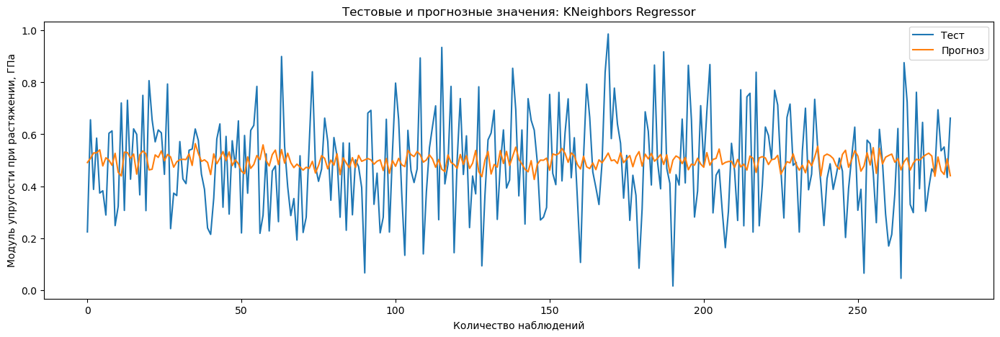

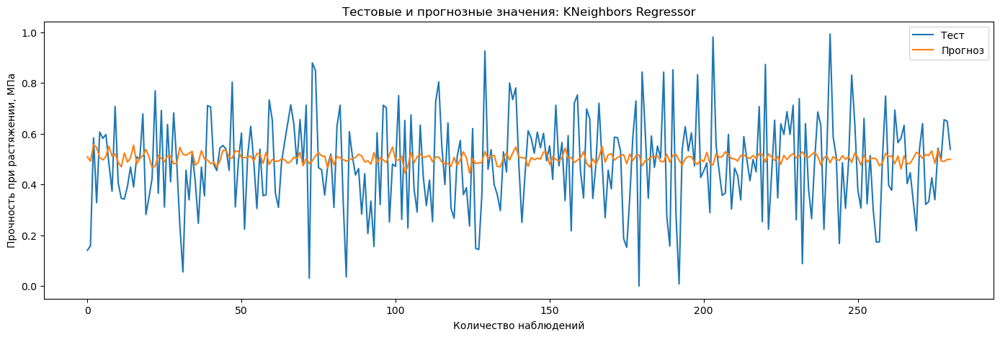

In [47]:
# Визуализация
actual_and_predicted_plot(y_test_upr.values, neigh_1.predict(X_test_upr), 'Модуль упругости при растяжении, ГПа', 'KNeighbors Regressor')
actual_and_predicted_plot(y_test_pr.values, neigh_2.predict(X_test_pr), 'Прочность при растяжении, МПа', 'KNeighbors Regressor')

#### Случайный лес

In [48]:
# Импортируем необходимые библиотеки
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV

In [49]:
rf_model = RandomForestRegressor()

parameters_rf = {
     'n_estimators' : [50, 100, 150],
     'criterion' : ['squared_error', 'absolute_error', 'poisson'],
     'max_depth' : [2, 3]
}

In [50]:
grid_search_rf = GridSearchCV(estimator = rf_model, param_grid = parameters_rf, cv=10)
grid_search_rf.fit(X_train_upr, np.ravel(y_train_upr))
best_rf_model = grid_search_rf.best_estimator_

grid_search_rf.best_params_

{'criterion': 'squared_error', 'max_depth': 3, 'n_estimators': 150}

In [51]:
y1_pred_rf = best_rf_model.predict(X_test_upr)

MSE_upr = mean_squared_error(y_test_upr, y1_pred_rf)
R2_upr = r2_score(y_test_upr, y1_pred_rf)


In [52]:

grid_search_rf = GridSearchCV(estimator = rf_model, param_grid = parameters_rf, cv=10)
grid_search_rf.fit(X_train_pr, np.ravel(y_train_pr))
best_rf_model = grid_search_rf.best_estimator_

grid_search_rf.best_params_

{'criterion': 'absolute_error', 'max_depth': 3, 'n_estimators': 50}

In [53]:
y2_pred_rf = best_rf_model.predict(X_test_pr)

MSE_pr = mean_squared_error(y_test_pr, y2_pred_rf)
R2_pr = r2_score(y_test_pr, y2_pred_rf)

In [54]:
rf_errors = pd.DataFrame({'model_name':'RandomForestRegressor',\
                                'target_var':['Модуль упругости при растяжении, ГПа', 'Прочность при растяжении, МПа'],\
                               'MSE':[MSE_upr, MSE_pr],\
                               'R2':[R2_upr, R2_pr]})
errors_df = pd.concat([errors_df, rf_errors], ignore_index=True)
errors_df

,target_var,model_name,MSE,R2
0,Модуль упругости при растяжении,Linear Regression,0.037967,-0.021335
1,Прочность при растяжении,Linear Regression,0.035043,-0.020508
2,"Модуль упругости при растяжении, ГПа",KNeighborsRegressor,0.037567,-0.010577
3,"Прочность при растяжении, МПа",KNeighborsRegressor,0.035460,-0.032639
4,"Модуль упругости при растяжении, ГПа",RandomForestRegressor,0.038259,-0.029186
5,"Прочность при растяжении, МПа",RandomForestRegressor,0.035015,-0.019699


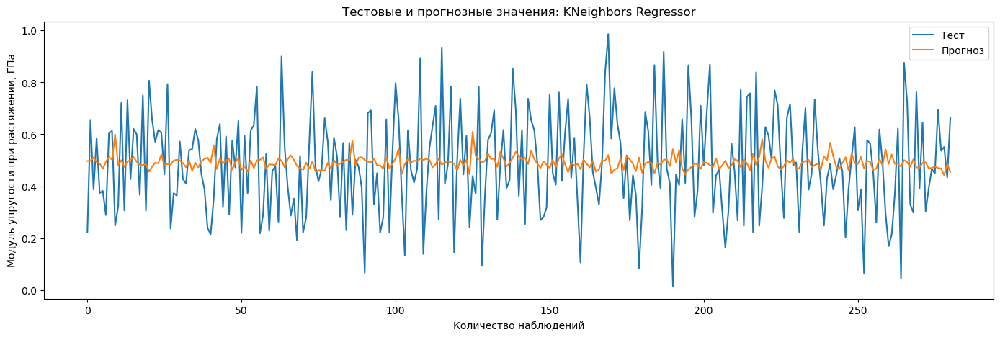

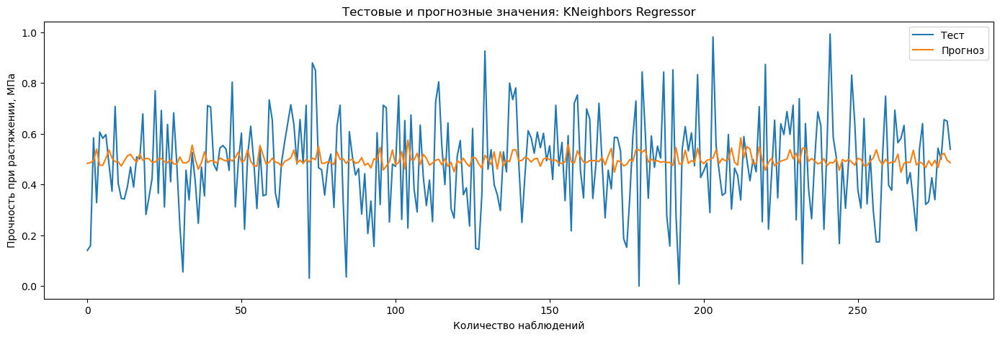

In [55]:
# Визуализация
actual_and_predicted_plot(y_test_upr.values, y1_pred_rf, 'Модуль упругости при растяжении, ГПа', 'KNeighbors Regressor')
actual_and_predicted_plot(y_test_pr.values, y2_pred_rf, 'Прочность при растяжении, МПа', 'KNeighbors Regressor')

### Построение нейронной для предсказания Соотношения матрица-наполнитель

In [99]:
#Сделаем процедуру для распечатки метрик
def print_metrics(y_test_values, y_pred_values):
    MSE = metrics.mean_squared_error(y_test_values, y_pred_values).round(3)
    MAE = metrics.mean_absolute_error(y_test_values, y_pred_values)
    CoefDet = metrics.r2_score(y_test_values, y_pred_values).round(3)
    print('Средняя квадратичная ошибка MSE=', MSE)
    print('Средняя абсолютная ошибка MAE=', MAE.round(3))
    print('Коэффициент детерминации R2=', CoefDet)
    print('Точность модели (%)', ((1-MAE/np.mean(y_test_values.values))*100).round(3)) 

In [80]:
# Импорт библиотек

import tensorflow.keras as keras
from tensorflow.keras.optimizers import SGD
import keras as keras
from keras.models import Sequential 
from keras.layers import Dense, Input, Dropout
from keras.optimizers import SGD

In [81]:
# Будем использовать нормализованные данные
X = df_norm.drop(['Соотношение матрица-наполнитель'], axis=1)
y = df_norm[['Соотношение матрица-наполнитель']]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1)

In [121]:
# Функция нейронной сети

def base_model():
    model = Sequential()
    model.add(Dense(10, input_dim=12, activation='tanh')) # скрытый полносвязный слой 1 
    model.add(Dense(10, activation='tanh')) # скрытый полносвязный слой 2
    model.add(Dense(1, activation='linear')) # выходной слой
    sgd = SGD(learning_rate=0.01, momentum=0.9, nesterov=True)
    model.compile(loss='mean_squared_error', optimizer='sgd')
    return model

In [122]:
batch_size = 140 
num_epochs = 100
valid_split = 0.1

In [123]:
# Создание и обучение нейронной сети
model = base_model()
history = model.fit(X_train, y_train, 
                    batch_size=batch_size, epochs=num_epochs,
                    verbose=1, validation_split=valid_split) 

Epoch 1/100
5/5 [==============================] - 1s 81ms/step - loss: 0.5852 - val_loss: 0.1971
Epoch 2/100
5/5 [==============================] - 0s 11ms/step - loss: 0.1257 - val_loss: 0.1210
Epoch 3/100
5/5 [==============================] - 0s 9ms/step - loss: 0.0946 - val_loss: 0.1041
Epoch 4/100
5/5 [==============================] - 0s 9ms/step - loss: 0.0878 - val_loss: 0.1005
Epoch 5/100
5/5 [==============================] - 0s 14ms/step - loss: 0.0841 - val_loss: 0.0960
Epoch 6/100
5/5 [==============================] - 0s 14ms/step - loss: 0.0807 - val_loss: 0.0914
Epoch 7/100
5/5 [==============================] - 0s 12ms/step - loss: 0.0774 - val_loss: 0.0883
Epoch 8/100
5/5 [==============================] - 0s 14ms/step - loss: 0.0747 - val_loss: 0.0863
Epoch 9/100
5/5 [==============================] - 0s 8ms/step - loss: 0.0723 - val_loss: 0.0840
Epoch 10/100
5/5 [==============================] - 0s 8ms/step - loss: 0.0700 - val_loss: 0.0820
Epoch 11/100
5/5 [=====

5/5 [==============================] - 0s 15ms/step - loss: 0.0392 - val_loss: 0.0475
Epoch 85/100
5/5 [==============================] - 0s 15ms/step - loss: 0.0391 - val_loss: 0.0461
Epoch 86/100
5/5 [==============================] - 0s 16ms/step - loss: 0.0390 - val_loss: 0.0467
Epoch 87/100
5/5 [==============================] - 0s 13ms/step - loss: 0.0390 - val_loss: 0.0472
Epoch 88/100
5/5 [==============================] - 0s 12ms/step - loss: 0.0390 - val_loss: 0.0472
Epoch 89/100
5/5 [==============================] - 0s 10ms/step - loss: 0.0389 - val_loss: 0.0460
Epoch 90/100
5/5 [==============================] - 0s 16ms/step - loss: 0.0387 - val_loss: 0.0461
Epoch 91/100
5/5 [==============================] - 0s 16ms/step - loss: 0.0387 - val_loss: 0.0452
Epoch 92/100
5/5 [==============================] - 0s 17ms/step - loss: 0.0387 - val_loss: 0.0458
Epoch 93/100
5/5 [==============================] - 0s 17ms/step - loss: 0.0386 - val_loss: 0.0447
Epoch 94/100
5/5 [=====

In [124]:
# Предсказание значения
y_pred = model.predict(X_test)

9/9 [==============================] - 0s 2ms/step


Средняя квадратичная ошибка MSE= 0.04
Средняя абсолютная ошибка MAE= 0.165
Коэффициент детерминации R2= -0.12
Точность модели (%) 67.874


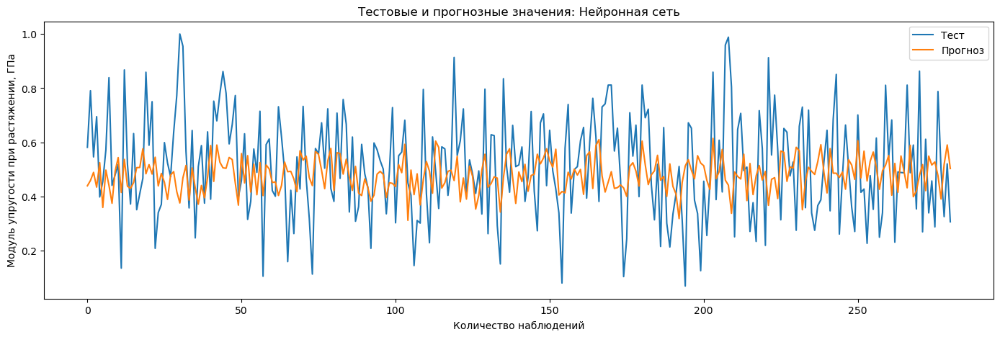

In [125]:
# Метрики, визуальной представление

print_metrics(y_test, y_pred)

actual_and_predicted_plot(y_test.values, y_pred, 'Соотношение матрица-наполнитель', 'Нейронная сеть')

Отрицательный коэффициент корреляции говорит о том, что модель работает слабо.

In [126]:
# Рассмотрим архитектуру модели
model.summary()

Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_24 (Dense)            (None, 10)                130       
                                                                 
 dense_25 (Dense)            (None, 10)                110       
                                                                 
 dense_26 (Dense)            (None, 1)                 11        
                                                                 
Total params: 251
Trainable params: 251
Non-trainable params: 0
_________________________________________________________________


Вариант 2

In [127]:
# Для улучшения работы сети попробуем изменить архитектуру
# Функция нейронной сети - вариант 2
def base_model():
    model = Sequential()
    model.add(Dense(10, input_dim=12, activation='tanh')) # скрытый полносвязный слой 1 
    model.add(Dropout(0.9))
    model.add(Dense(10, activation='tanh')) # скрытый полносвязный слой 2
    model.add(Dense(1, activation='linear')) # выходной слой
    sgd = SGD(learning_rate=0.01, momentum=0.9, nesterov=True)
    model.compile(loss='mean_squared_error', optimizer='sgd')
    return model

In [142]:
# Создание и обучений нейронной сети
model = base_model()
history = model.fit(X_train, y_train, 
                    epochs=80, verbose=0, validation_split=valid_split)  

In [143]:
#Предсказываем значения
y_pred = model.predict(X_test)

9/9 [==============================] - 0s 3ms/step


Средняя квадратичная ошибка MSE= 0.037
Средняя абсолютная ошибка MAE= 0.157
Коэффициент детерминации R2= -0.034
Точность модели (%) 69.394


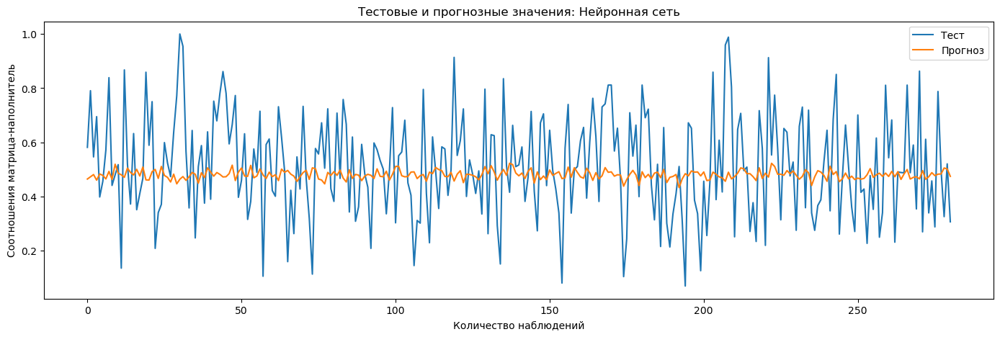

In [144]:
# Метрики, визуальной представление

print_metrics(y_test, y_pred)

actual_and_predicted_plot(y_test.values, y_pred, 'Соотношения матрица-наполнитель', 'Нейронная сеть')

Вариант 3

In [138]:
# Функция нейронной сети - вариант 3
def base_model():
    model = Sequential()
    model.add(Dense(10, input_dim=12, activation='tanh')) # скрытый полносвязный слой 1
    model.add(Dense(10, activation='tanh')) # скрытый полносвязный слой 2
    model.add(Dropout(0.5))
    model.add(Dense(1, activation='linear')) # выходной слой
    model.compile(loss='mean_squared_error', optimizer='sgd')
    return model

In [145]:
# Создание и обучений нейронной сети
model = base_model()
history = model.fit(X_train, y_train, 
                    epochs=30,
                    verbose=1, validation_split=0.1) 

Epoch 1/30
19/19 [==============================] - 1s 19ms/step - loss: 0.2463 - val_loss: 0.0935
Epoch 2/30
19/19 [==============================] - 0s 5ms/step - loss: 0.1645 - val_loss: 0.0791
Epoch 3/30
19/19 [==============================] - 0s 5ms/step - loss: 0.1278 - val_loss: 0.0706
Epoch 4/30
19/19 [==============================] - 0s 5ms/step - loss: 0.1147 - val_loss: 0.0666
Epoch 5/30
19/19 [==============================] - 0s 5ms/step - loss: 0.1057 - val_loss: 0.0608
Epoch 6/30
19/19 [==============================] - 0s 5ms/step - loss: 0.0997 - val_loss: 0.0586
Epoch 7/30
19/19 [==============================] - 0s 5ms/step - loss: 0.0964 - val_loss: 0.0520
Epoch 8/30
19/19 [==============================] - 0s 5ms/step - loss: 0.0841 - val_loss: 0.0527
Epoch 9/30
19/19 [==============================] - 0s 5ms/step - loss: 0.0865 - val_loss: 0.0491
Epoch 10/30
19/19 [==============================] - 0s 4ms/step - loss: 0.0790 - val_loss: 0.0503
Epoch 11/30
19/19 

In [146]:
#Предсказываем значения
y_pred = model.predict(X_test)

9/9 [==============================] - 0s 2ms/step


Средняя квадратичная ошибка MSE= 0.04
Средняя абсолютная ошибка MAE= 0.164
Коэффициент детерминации R2= -0.103
Точность модели (%) 68.126


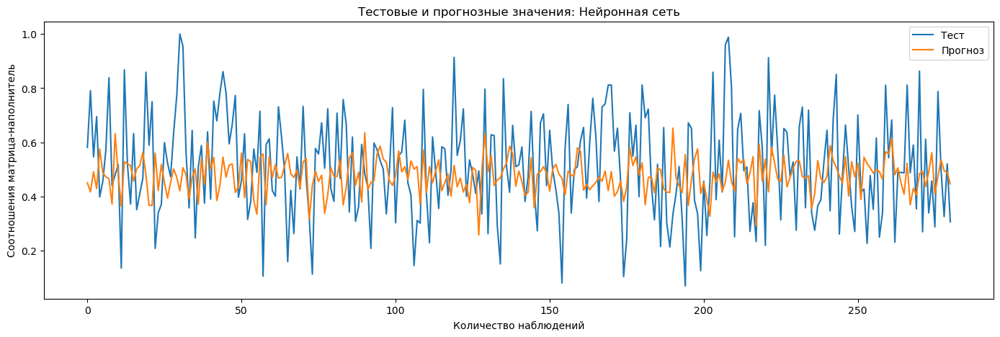

In [147]:
# Метрики, визуальной представление

print_metrics(y_test, y_pred)

actual_and_predicted_plot(y_test.values, y_pred, 'Соотношения матрица-наполнитель', 'Нейронная сеть')

Во всех трех вариантах отрицательный коэффициент корреляции говорит о том, что модель работает слабо.   
Изменением параметров нейронной сети, улучшить модель не удалось.